In [1]:
import os
import sys
import scanpy as sp
import seaborn as sns
import matplotlib.pyplot as plt
import json
import sys
import pandas as pd
import numpy as np
import scvi
scvi.settings.seed = 0
from scipy.sparse import vstack
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.neighbors import KNeighborsClassifier
import umap
import treeclust as tc

from functions_automatic_threshold import *
from functions_DE_stats import *

import warnings
warnings.filterwarnings("ignore")

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/conda/lib/python3.11/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/opt/conda/lib/python3.11/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
Jax plugin configuration error: Exception when calling jax_plugins.xla_cuda12.initialize()
Traceback (most recent call last):
  File "/homes/users/gtorregrosa2/scratch/Jupyter/packages/lib/python3.11/site-packages/jax/_src/xla_bridge.py", line 328, in discover_pj

In [2]:
figures_folder = "figures"
data_folder = "data"
# data_folder = "data_mouse/pijuan"
save_format = "png" 
parameters_file = "parameters_by_batch.csv"

# analysis_name = "dias_120h_EM_1"
# analysis_name = "dias_120h_EM_2"
# analysis_name = "dias_144h_EM_1"
# analysis_name = "dias_144h_EM_2"
# analysis_name = "dias_144h_EM_old"
# analysis_name = "dias_144h_EM_2"

# analysis_name = "aydan_120h_GSE195544" 
# analysis_name = "dias_48h_EM"
# analysis_name = "dias_72h_EM"
# analysis_name = "dias_96h_EM"
# analysis_name = "dias_120h_EM"
analysis_name = "dias_144h_EM"
# analysis_name = "mayran_120h_GSM7035396" 
# analysis_name = "mayran_120h_GSM7035397" 
# analysis_name = "prisca_120h_GSM7164729" 
# analysis_name = "prisca_72h_GSM7329489" 
# analysis_name = "prisca_48h_GSM7164723" 
# analysis_name = "prisca_48h_GSM7329487"  # Does not work, weirdly
# analysis_name = "susanne_120h_GSM4040776" 
# analysis_name = "susanne_120h_GSM4040777" 
# analysis_name = "susanne_120h_GSM4040778" 
# analysis_name = "susanne_120h_GSM4040779" 
# analysis_name = "wolf_108h_120h_GSM6508472" 
# analysis_name = "wolf_108h_120h_GSM6508473" 
# analysis_name = "wolf_108h_120h_GSM6508474" 
# analysis_name = "wolf_120h_GSM6508455" 
# analysis_name = "wolf_120h_GSM6508456" 
# analysis_name = "wolf_120h_GSM6508457" 
# analysis_name = "wolf_72h_GSM6508453" 
# analysis_name = "wolf_72h_GSM6508466" 
# analysis_name = "wolf_72h_GSM6508467"
# analysis_name = "pijuan_E6.5_1" 
# analysis_name = "pijuan_E7.5_2" 
# analysis_name = "pijuan_E7.5_3" 
# analysis_name = "pijuan_E7.5_4" 
# analysis_name = "pijuan_E6.5_5" 
# analysis_name = "pijuan_E7.5_6" 
# analysis_name = "pijuan_E6.75_7" 
# analysis_name = "pijuan_E7.75_8" 
# analysis_name = "pijuan_E7.75_9" 
# analysis_name = "pijuan_E7.0_10" 
# analysis_name = "pijuan_E7.75_12" 
# analysis_name = "pijuan_E7.75_13" 
# analysis_name = "pijuan_E7.0_14" 
# analysis_name = "pijuan_E7.0_15" 
# analysis_name = "pijuan_E8.0_16" 
# analysis_name = "pijuan_E8.5_17" 
# analysis_name = "pijuan_E6.5_18" 
# analysis_name = "pijuan_E7.5_19" 
# analysis_name = "pijuan_E7.5_20" 
# analysis_name = "pijuan_E7.25_23" 
# analysis_name = "pijuan_E8.25_24" 
# analysis_name = "pijuan_E8.25_25" 
# analysis_name = "pijuan_E7.25_26" 
# analysis_name = "pijuan_E7.25_27" 
# analysis_name = "pijuan_E8.25_28" 
# analysis_name = "pijuan_E8.5_29" 
# analysis_name = "pijuan_E7.0_30" 
# analysis_name = "pijuan_E7.0_31" 
# analysis_name = "pijuan_E7.0_32" 
# analysis_name = "pijuan_E8.0_33" 
# analysis_name = "pijuan_E8.0_34" 
# analysis_name = "pijuan_E8.0_35" 
# analysis_name = "pijuan_E8.5_36" 
# analysis_name = "pijuan_E8.5_37" 
# analysis_name = "pijuan_E9.0_38" 
# analysis_name = "pijuan_E9.0_39" 
# analysis_name = "pijuan_E9.0_40" 
# analysis_name = "pijuan_E9.0_41" 
# analysis_name = "pijuan_E9.0_42" 
# analysis_name = "pijuan_E9.0_43" 
# analysis_name = "pijuan_E9.0_44" 
# analysis_name = "pijuan_E9.0_45" 
# analysis_name = "pijuan_E9.0_46" 
# analysis_name = "pijuan_E9.0_47" 
# analysis_name = "pijuan_E9.0_48" 
# analysis_name = "pijuan_E9.0_49" 
# analysis_name = "pijuan_E9.0_50" 
# analysis_name = "pijuan_E9.0_51" 
# analysis_name = "pijuan_E9.0_52" 
# analysis_name = "pijuan_E9.0_53" 
# analysis_name = "pijuan_E8.75_54" 
# analysis_name = "pijuan_E8.75_55" 
# analysis_name = "pijuan_E8.75_56" 
# analysis_name = "pijuan_E8.75_57" 
# analysis_name = "pijuan_E8.75_58" 
# analysis_name = "pijuan_E8.75_59" 
# analysis_name = "pijuan_E8.75_60" 
# analysis_name = "pijuan_E8.75_61" 
# analysis_name = "pijuan_E8.75_62" 
# analysis_name = "pijuan_E8.75_63" 
# analysis_name = "pijuan_E8.75_64" 
# analysis_name = "pijuan_E8.75_65" 
# analysis_name = "pijuan_E8.75_66" 
# analysis_name = "pijuan_E8.75_67" 
# analysis_name = "pijuan_E8.75_68" 
# analysis_name = "pijuan_E8.75_69" 
# analysis_name = "pijuan_E9.25_70" 
# analysis_name = "pijuan_E9.25_71" 
# analysis_name = "pijuan_E9.25_72" 
# analysis_name = "pijuan_E9.25_73" 
# analysis_name = "pijuan_E9.25_74" 
# analysis_name = "pijuan_E9.25_75" 
# analysis_name = "pijuan_E9.25_76" 
# analysis_name = "pijuan_E9.25_77" 
# analysis_name = "pijuan_E9.25_78" 
# analysis_name = "pijuan_E9.25_79" 
# analysis_name = "pijuan_E9.25_80" 
# analysis_name = "pijuan_E9.25_81" 
# analysis_name = "pijuan_E9.25_82" 
# analysis_name = "pijuan_E9.25_83" 
# analysis_name = "pijuan_E9.25_84" 
# analysis_name = "pijuan_E9.25_85" 
# analysis_name = "pijuan_E8.5_86" 
# analysis_name = "pijuan_E8.5_87" 
# analysis_name = "pijuan_E8.5_88" 
# analysis_name = "pijuan_E8.5_89" 
# analysis_name = "pijuan_E8.5_90" 
# analysis_name = "pijuan_E8.5_91" 
# analysis_name = "pijuan_E8.5_92" 
# analysis_name = "pijuan_E8.5_93" 
# analysis_name = "pijuan_E8.5_94" 
# analysis_name = "pijuan_E8.5_95" 
# analysis_name = "pijuan_E8.5_96" 
# analysis_name = "pijuan_E8.5_97" 
# analysis_name = "pijuan_E9.5_98" 
# analysis_name = "pijuan_E9.5_99" 
# analysis_name = "pijuan_E9.5_100" 
# analysis_name = "pijuan_E9.5_101" 
# analysis_name = "pijuan_E9.5_102" 
# analysis_name = "pijuan_E9.5_103" 
# analysis_name = "pijuan_E9.5_104" 
# analysis_name = "pijuan_E9.5_105"

In [3]:
print(f"Processing: {analysis_name}")

Processing: dias_144h_EM


In [4]:
folder = analysis_name.split('_')[0]
file_raw = f"{data_folder}/{analysis_name}.h5ad"
file_modified = f"{data_folder}/{analysis_name}_processed.h5ad"
output_folder = f"{figures_folder}/{folder}"
parameters_filled = parameters_file.split(".csv")[0]+"_filled.csv"

if not os.path.isdir(f"{figures_folder}"):
    os.mkdir(f"{figures_folder}")
if not os.path.isdir(f"{output_folder}"):
    os.mkdir(f"{output_folder}")
if not os.path.isdir(f"{output_folder}/{analysis_name}"):
    os.mkdir(f"{output_folder}/{analysis_name}")
if not os.path.isdir(f"{output_folder}/{analysis_name}/umap_genes"):
    os.mkdir(f"{output_folder}/{analysis_name}/umap_genes")
if not os.path.isdir(f"{output_folder}/{analysis_name}/clusters"):
    os.mkdir(f"{output_folder}/{analysis_name}/clusters")
if not os.path.isdir(f"{output_folder}/{analysis_name}/clusters_v2"):
    os.mkdir(f"{output_folder}/{analysis_name}/clusters_v2")

In [5]:
parameters = pd.read_csv(parameters_file,index_col=0).loc[analysis_name,:].dropna().to_dict()
parameters

{'total_counts_min': 14000.0,
 'total_counts_max': 140000.0,
 'n_genes_by_counts_min': 5000.0,
 'n_genes_by_counts_max': 12000.0,
 'pct_counts_mt_fraction_min': 1.0,
 'pct_counts_mt_fraction_max': 20.0,
 'metric': 'correlation',
 'n_top_genes': 2000,
 'n_pcs': 30.0,
 'pca_random_factor': 3,
 'remove_doublets': True,
 'clustering_threshold': 0.5,
 'clusters': '[20,21,27,28,9,22,23,24,13,25,26,15,18,19,17,11,5,6,7]'}

# QC

## Load

In [6]:
adata = sp.read_h5ad(file_raw)

In [7]:
if "Gene" in adata.var.columns.values:
    adata.var["gene"] = adata.var["Gene"]

In [8]:
adata.var_name = adata.var["gene"].values
adata.var.index = adata.var["gene"].values.astype(str)
adata.var_names_make_unique()

In [9]:
s_genes = [i for i in pd.read_csv("cell_cycle_G1_S.txt",header=None).values.flatten() if i in adata.var_names]
g2m_genes = [i for i in pd.read_csv("cell_cycle_G2_M.txt",header=None).values.flatten() if i in adata.var_names]

cycle_genes = s_genes+g2m_genes

In [10]:
marker_size = min(100000/adata.shape[0],10)

## Save count layer

In [11]:
adata.layers["counts"] = adata.X.copy()

## Calculate QC metrics

In [12]:
adata = adata[adata.X.sum(axis=1) > 500,:]
adata

View of AnnData object with n_obs × n_vars = 25673 × 55401
    obs: 'Barcode', 'Cell', 'Sample', 'total_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'ENS', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gene'
    obsm: 'Raw'
    layers: 'counts'

In [13]:
adata.var["mt_fraction"] = adata.var["gene"].str.startswith("mt-")

sp.pp.calculate_qc_metrics(adata, qc_vars=["mt_fraction"], inplace=True)

In [14]:
if "total_counts_min" not in parameters.keys() or "total_counts_max" not in parameters.keys():
    c = automatic_qc_threshold(adata.obs["total_counts"].values)
    print("Threshold estimation total_counts: ", c)
if "total_counts_min" not in parameters.keys():
    parameters["total_counts_min"] = c[0]
if "total_counts_max" not in parameters.keys():
    parameters["total_counts_max"] = c[1]

if "n_genes_by_counts_min" not in parameters.keys() or "n_genes_by_counts_max" not in parameters.keys():
    c = automatic_qc_threshold(adata.obs["n_genes_by_counts"].values)
    print("Threshold estimation n_genes_by_counts: ", c)
if "n_genes_by_counts_min" not in parameters.keys():
    parameters["n_genes_by_counts_min"] = c[0]
if "n_genes_by_counts_max" not in parameters.keys():
    parameters["n_genes_by_counts_max"] = c[1]

if "pct_counts_mt_fraction_min" not in parameters.keys() or "pct_counts_mt_fraction_max" not in parameters.keys():
    c = automatic_qc_threshold(adata.obs["pct_counts_mt_fraction"].values, min_value=0)
    print("Threshold estimation pct_counts_mt_fraction: ", c)
if "pct_counts_mt_fraction_min" not in parameters.keys():
    parameters["pct_counts_mt_fraction_min"] = c[0]
if "pct_counts_mt_fraction_max" not in parameters.keys():
    parameters["pct_counts_mt_fraction_max"] = c[1]


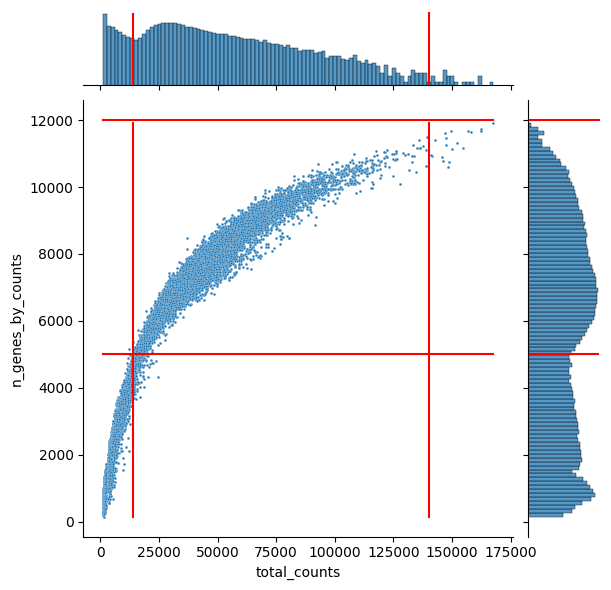

In [15]:
#Plot counts and genes
fig = sns.jointplot(
        data=adata.obs.sort_values("pct_counts_mt_fraction"),
        x = "total_counts",                
        y = "n_genes_by_counts",       
        s=marker_size,
        # c = "total_counts_mt_fraction",         
        kind="scatter",
        marginal_kws=dict(bins=100)
    )
fig.ax_joint.plot(
    [parameters["total_counts_min"]]*2, 
    [adata.obs["n_genes_by_counts"].min(), adata.obs["n_genes_by_counts"].max()],
    color="red"
)
fig.ax_joint.plot(
    [parameters["total_counts_max"]]*2, 
    [adata.obs["n_genes_by_counts"].min(), adata.obs["n_genes_by_counts"].max()],
    color="red"
)
fig.ax_joint.plot(
    [adata.obs["total_counts"].min(), adata.obs["total_counts"].max()],
    [parameters["n_genes_by_counts_min"]]*2, 
    color="red"
)
fig.ax_joint.plot(
    [adata.obs["total_counts"].min(), adata.obs["total_counts"].max()],
    [parameters["n_genes_by_counts_max"]]*2, 
    color="red"
)
fig.ax_marg_x.plot(
    [parameters["total_counts_min"]]*2, 
    [0, fig.ax_marg_x.get_ylim()[1]],
    color="red"    
)
fig.ax_marg_x.plot(
    [parameters["total_counts_max"]]*2, 
    [0, fig.ax_marg_x.get_ylim()[1]],
    color="red"    
)
fig.ax_marg_x.set_yscale(
    "log"
)
fig.ax_marg_y.plot(
    [0, fig.ax_marg_y.get_xlim()[1]],
    [parameters["n_genes_by_counts_min"]]*2, 
    color="red"    
)
fig.ax_marg_y.plot(
    [0, fig.ax_marg_y.get_xlim()[1]],
    [parameters["n_genes_by_counts_max"]]*2, 
    color="red"    
)
fig.ax_marg_y.set_xscale(
    "log"
)

fig.savefig(f"{output_folder}/{analysis_name}/qc.{save_format}")    

## Meta QC

In [16]:
if "meta_kept" in adata.obs.columns:

    #Plot counts and genes
    fig = sns.jointplot(
            data=adata.obs,
            x = "total_counts",                
            y = "n_genes_by_counts",   
            hue = "meta_kept",
            # c = "total_counts_mt_fraction",        
            s=10,
            kind="scatter"                            
        )
    fig.ax_joint.plot(
        [parameters["total_counts_min"]]*2, 
        [adata.obs["n_genes_by_counts"].min(), adata.obs["n_genes_by_counts"].max()],
        color="red"
    )
    fig.ax_joint.plot(
        [parameters["total_counts_max"]]*2, 
        [adata.obs["n_genes_by_counts"].min(), adata.obs["n_genes_by_counts"].max()],
        color="red"
    )
    fig.ax_joint.plot(
        [adata.obs["total_counts"].min(), adata.obs["total_counts"].max()],
        [parameters["n_genes_by_counts_min"]]*2, 
        color="red"
    )
    fig.ax_joint.plot(
        [adata.obs["total_counts"].min(), adata.obs["total_counts"].max()],
        [parameters["n_genes_by_counts_max"]]*2, 
        color="red"
    )
    fig.ax_marg_x.plot(
        [parameters["total_counts_min"]]*2, 
        [0, fig.ax_marg_x.get_ylim()[1]],
        color="red"    
    )
    fig.ax_marg_x.plot(
        [parameters["total_counts_max"]]*2, 
        [0, fig.ax_marg_x.get_ylim()[1]],
        color="red"    
    )
    fig.ax_marg_y.plot(
        [0, fig.ax_marg_y.get_xlim()[1]],
        [parameters["n_genes_by_counts_min"]]*2, 
        color="red"    
    )
    fig.ax_marg_y.plot(
        [0, fig.ax_marg_y.get_xlim()[1]],
        [parameters["n_genes_by_counts_max"]]*2, 
        color="red"    
    )
    
    fig.savefig(f"{output_folder}/{analysis_name}/qc_meta_kept.{save_format}")    

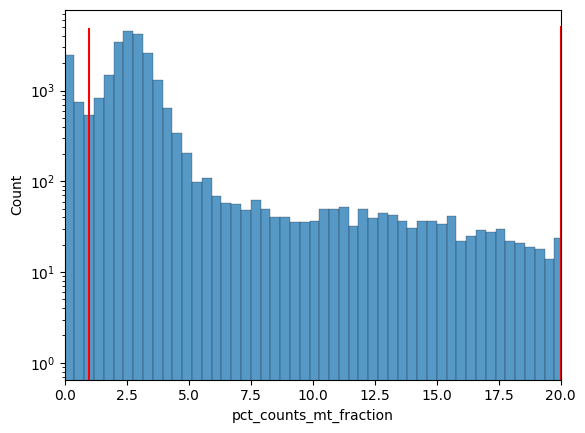

In [17]:
#Plot mt fraction
fig, ax = plt.subplots(1,1)
sns.histplot(data=adata.obs,x="pct_counts_mt_fraction",ax=ax, bins=200)
ax.plot(
    [parameters["pct_counts_mt_fraction_min"]]*2, 
    ax.get_ylim(),
    color="red"
)
ax.plot(
    [parameters["pct_counts_mt_fraction_max"]]*2, 
    ax.get_ylim(),
    color="red"
)
ax.set_xlim(0,parameters["pct_counts_mt_fraction_max"])
ax.set_yscale("log")
fig.savefig(f"{output_folder}/{analysis_name}/qc_mt.{save_format}")        

## Filter

In [18]:
# Filter by quality control
adata = adata[adata.obs["total_counts"] >= parameters["total_counts_min"],:]
adata = adata[adata.obs["total_counts"] <= parameters["total_counts_max"],:]

adata = adata[adata.obs["n_genes_by_counts"] >= parameters["n_genes_by_counts_min"],:]
adata = adata[adata.obs["n_genes_by_counts"] <= parameters["n_genes_by_counts_max"],:]

adata = adata[adata.obs["pct_counts_mt_fraction"] >= parameters["pct_counts_mt_fraction_min"],:]
adata = adata[adata.obs["pct_counts_mt_fraction"] <= parameters["pct_counts_mt_fraction_max"],:]

In [19]:
adata

View of AnnData object with n_obs × n_vars = 18813 × 55401
    obs: 'Barcode', 'Cell', 'Sample', 'total_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_mt_fraction', 'log1p_total_counts_mt_fraction', 'pct_counts_mt_fraction'
    var: 'ENS', 'Gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gene', 'mt_fraction'
    obsm: 'Raw'
    layers: 'counts'

In [20]:
marker_size = min(100000/adata.shape[0],10)

# Doublets

In [21]:
sp.pp.highly_variable_genes(adata,flavor="seurat_v3",n_top_genes=2000)
adata_ = adata[:,adata.var["highly_variable"].values]
adata_ = adata_.copy()

## SOLO

In [22]:
scvi.model.SCVI.setup_anndata(adata_)
vae = scvi.model.SCVI(adata_)
batch_size = 128
not_worked=True
while not_worked:
    try:
        vae.train(
            max_epochs=200,
            early_stopping=True,
            check_val_every_n_epoch=1,
            early_stopping_monitor='elbo_validation',
            batch_size=batch_size
        )
        not_worked = False
    except:
        batch_size *= 2

I0000 00:00:1762175721.553139 2730354 tfrt_cpu_pjrt_client.cc:349] TfrtCpuClient created.
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA L40S') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 200/200: 100%|██████████| 200/200 [02:43<00:00,  1.22it/s, v_num=1, train_loss_step=1.55e+3, train_loss_epoch=1.53e+3]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [02:43<00:00,  1.22it/s, v_num=1, train_loss_step=1.55e+3, train_loss_epoch=1.53e+3]


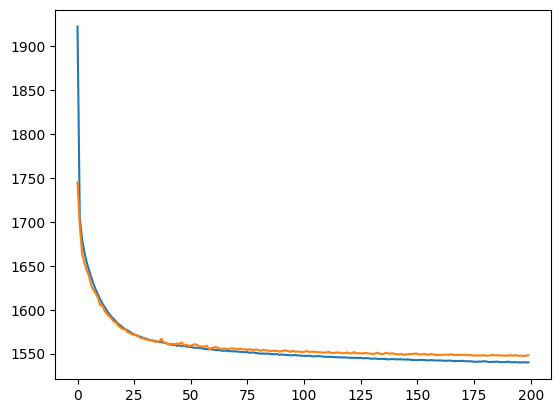

In [23]:
plt.plot(vae.history["elbo_train"].values)
plt.plot(vae.history["elbo_validation"].values)

In [24]:
adata.obsm["X_scvi"] = vae.get_latent_representation()

In [25]:
solo = scvi.external.SOLO.from_scvi_model(vae)
batch_size = 128
not_worked = True
while not_worked:
    try:
        solo.train(batch_size=batch_size)
        not_worked = False
    except:
        batch_size *= 2


INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 173/400:  43%|████▎     | 173/400 [01:56<02:33,  1.48it/s, v_num=1, train_loss_step=0.261, train_loss_epoch=0.215]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.199. Signaling Trainer to stop.


In [26]:
adata.obs["doublets_solo"] = solo.predict(soft=False).values == "doublet"

In [27]:
X_umap_scvi = umap.UMAP(metric=parameters["metric"],random_state=0).fit_transform(adata.obsm["X_scvi"])

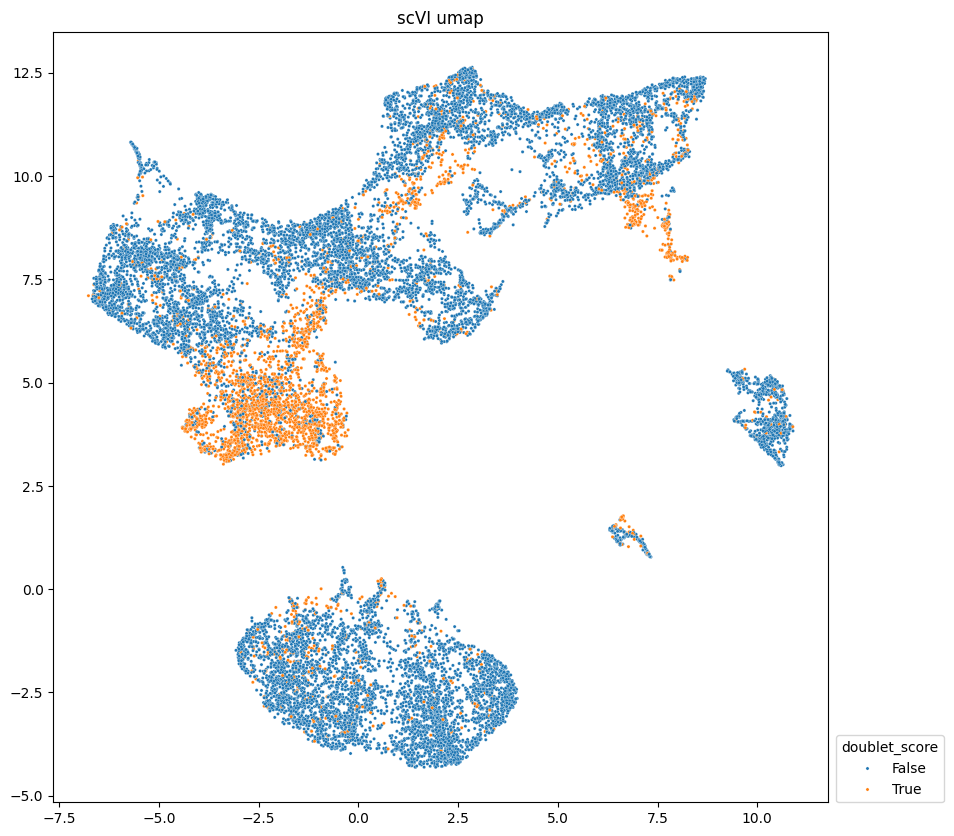

In [28]:
fig, ax = plt.subplots(1,1,figsize=(10,10))

sns.scatterplot(
    x=X_umap_scvi[:,0], 
    y=X_umap_scvi[:,1], 
    hue=adata.obs["doublets_solo"],
    ax=ax,
    s=marker_size
)
ax.set_title("scVI umap")
ax.legend(loc=(1.01,0),title="doublet_score")

fig.savefig(f"{output_folder}/{analysis_name}/qc_solo.{save_format}")

## Meta QC

In [29]:
if "meta_kept" in adata.obs.columns:
    
    fig, ax = plt.subplots(1,2,figsize=(20,10))

    sns.scatterplot(
        x=X_umap_scvi[:,0], 
        y=X_umap_scvi[:,1], 
        hue=adata.obs["meta_kept"],
        ax=ax[0],
    )
    ax[0].set_title("scVI umap")
    ax[0].legend(loc=(1.01,0),title="kept")

    m = adata.obs.groupby(["meta_kept","doublets_solo"]).count()["barcode"].unstack()
    sns.heatmap(
        m,
        annot=True,
        ax=ax[1],
    )
    ax[1].set_title("scVI umap")
    ax[1].legend(loc=(1.01,0),title="kept")
    
    fig.savefig(f"{output_folder}/{analysis_name}/qc_meta_doublets.{save_format}")        

## Filter

In [30]:
if "remove_doublets" in parameters.keys():
    if parameters["remove_doublets"]:
        adata = adata[adata.obs["doublets_solo"].values==False,:]

In [31]:
marker_size = min(100000/adata.shape[0],10)

## Save

In [32]:
adata.write(file_modified)

# Dimensionality Reduction

## Load

In [33]:
adata = sp.read_h5ad(file_modified)

## Score cell cycle

In [34]:
sp.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

## Preprocessing

In [35]:
if "target_sum" not in parameters:
    bins,pos = np.histogram(adata.obs["total_counts"].values,bins=100)
    m = np.argmax(bins)
    t = (pos[m]+pos[m+1])/2
    parameters["target_sum"] = t

In [36]:
sp.pp.normalize_total(adata,target_sum=parameters["target_sum"])
sp.pp.log1p(adata)

In [37]:
sp.pp.highly_variable_genes(adata, n_top_genes=parameters["n_top_genes"])

## PCA

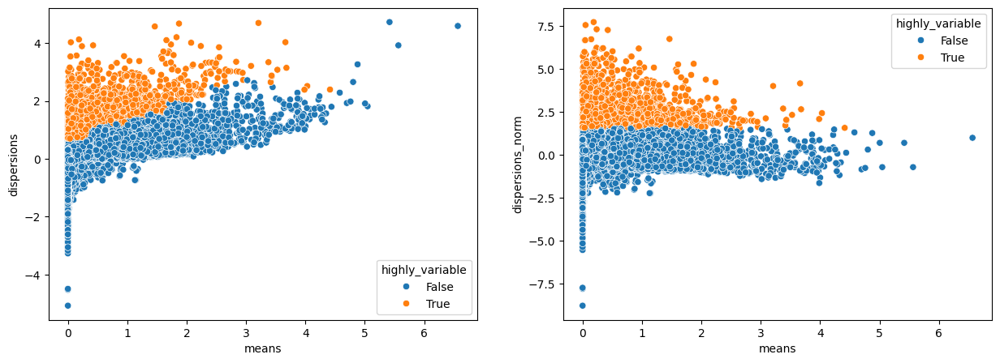

In [38]:
fig,ax = plt.subplots(1,2,figsize=[15,5])
sns.scatterplot(data = adata.var, x="means", y="dispersions", hue="highly_variable", ax=ax[0])
sns.scatterplot(data = adata.var, x="means", y="dispersions_norm", hue="highly_variable", ax=ax[1])
fig.savefig(f"{output_folder}/{analysis_name}/dr_hvgs.{save_format}")        

### PCA

In [39]:
comps = 100

In [40]:
sp.pp.pca(adata, n_comps=comps, use_highly_variable=True)

In [41]:
def scramble(a, axis=0):
    """
    Return an array with the values of `a` independently shuffled along the
    given axis
    """ 
    a = a.toarray()
    axis_ = abs(1-axis)
    for i in range(a.shape[axis]):
        idx = np.random.choice(a.shape[axis_], a.shape[axis_], replace=False)
        if axis == 0: 
            a[i,:] = a[i,idx]
        else:
            a[:,i] = a[idx,i]
    
    return a

def automatic_pca_selection(X,n_components=comps):
    
    X = scramble(X)
    ev = PCA(n_components=n_components).fit(X).explained_variance_ratio_

    return ev

In [42]:
X = adata.X[:,adata.var["highly_variable"]]
ev = automatic_pca_selection(X)

if "n_pcs" not in parameters.keys() :
    parameters["n_pcs"] = sum(adata.uns['pca']['variance_ratio']>ev*parameters["pca_random_factor"])
    
print(f"Selection PCA: {sum(adata.uns['pca']['variance_ratio']>ev*parameters['pca_random_factor'])}")

Selection PCA: 31


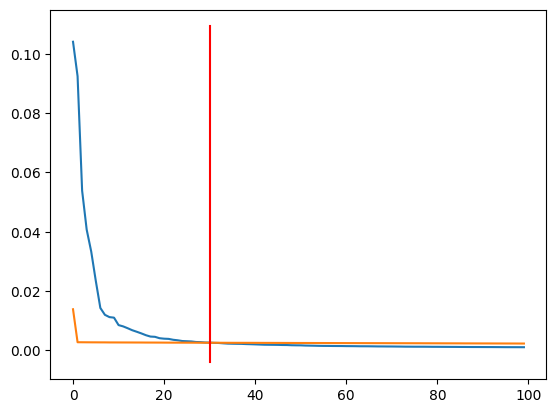

In [43]:
fig,ax = plt.subplots(1,1)
sns.lineplot(x=np.arange(comps),y=adata.uns["pca"]["variance_ratio"])
sns.lineplot(x=np.arange(comps),y=ev*parameters["pca_random_factor"])
ax.plot(
    [parameters["n_pcs"]]*2, 
    ax.get_ylim(),
    color="red"
)
fig.savefig(f"{output_folder}/{analysis_name}/dr_explained.{save_format}")          

## Cell cycle correction

In [44]:
m = sp.AnnData(adata.obsm["X_pca"],obs=adata.obs)
sp.pp.regress_out(m,["S_score","G2M_score"])
adata.obsm["X_pca_phase"] = m.X

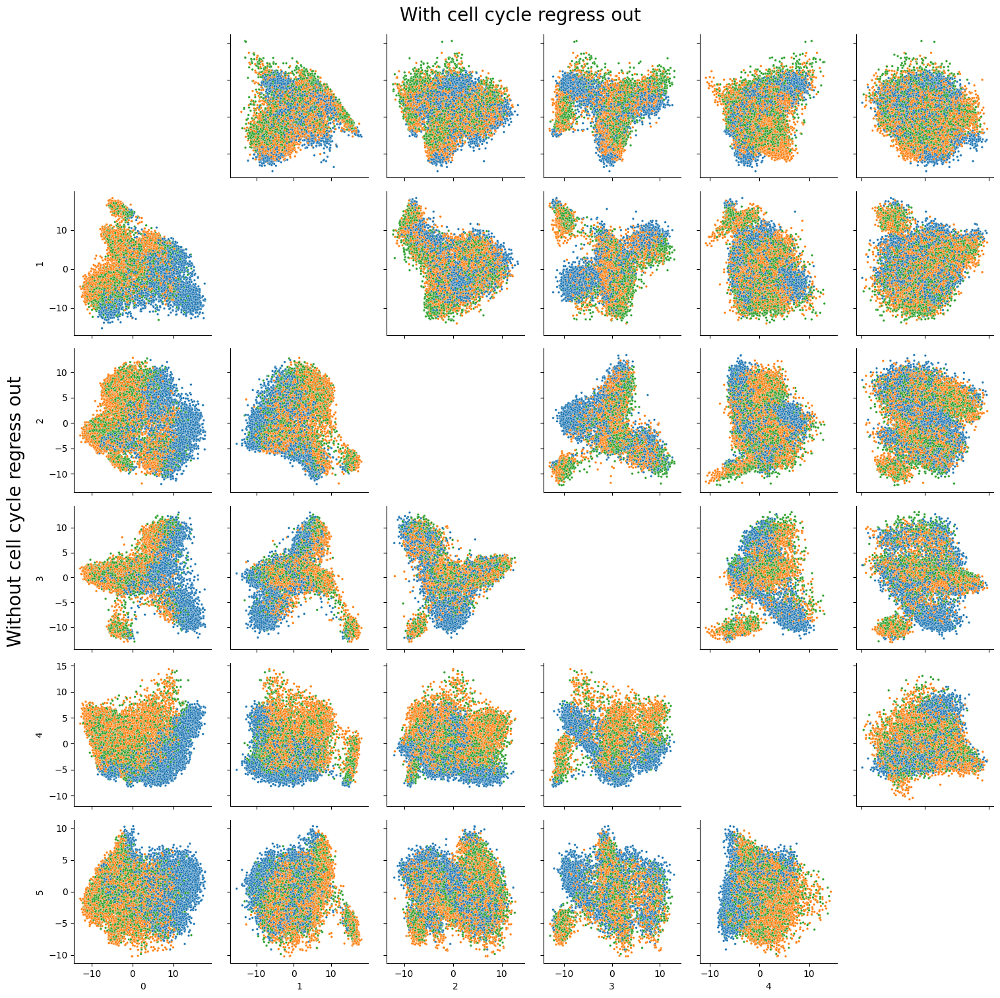

In [45]:
fig = sns.PairGrid(pd.DataFrame(adata.obsm["X_pca"][:,:6]))
fig.map_lower(sns.scatterplot, s=marker_size, hue=adata.obs['phase'].values)
fig.data = pd.DataFrame(adata.obsm["X_pca_phase"][:,:6])
fig.map_upper(sns.scatterplot, s=marker_size, hue=adata.obs['phase'].values)
for i in range(6):
    fig.axes[i,i].set_visible(False)
# fig.axes[3,0].set_ylabel("Without cell cycle regression",fontsize=20)
# fig.axes[0,3].set_title("With cell cycle regression",fontsize=20)
fig.fig.suptitle("With cell cycle regress out", fontsize=20, y=1.01)
fig.fig.text(-0.01, 0.5, 'Without cell cycle regress out', va='center', ha='center', rotation='vertical', fontsize=20)
fig.savefig(f"{output_folder}/{analysis_name}/dr_pcs.{save_format}")    

### UMAP representation

In [46]:
sp.pp.neighbors(adata, 
                metric=parameters["metric"], 
                n_pcs=40,#int(parameters["n_pcs"]),
                use_rep="X_pca",
                key_added="neighbors_pca",
                n_neighbors=10,
)
sp.tl.umap(adata, neighbors_key="neighbors_pca")
adata.obsm["X_umap_pca"] = adata.obsm["X_umap"].copy()

In [47]:
sp.pp.neighbors(adata, 
                metric=parameters["metric"], 
                n_pcs=int(parameters["n_pcs"]),
                use_rep="X_pca_phase",
                key_added="neighbors_pca_phase",
                n_neighbors=10,
)
sp.tl.umap(adata, neighbors_key="neighbors_pca_phase")
adata.obsm["X_umap_pca_phase"] = adata.obsm["X_umap"].copy()

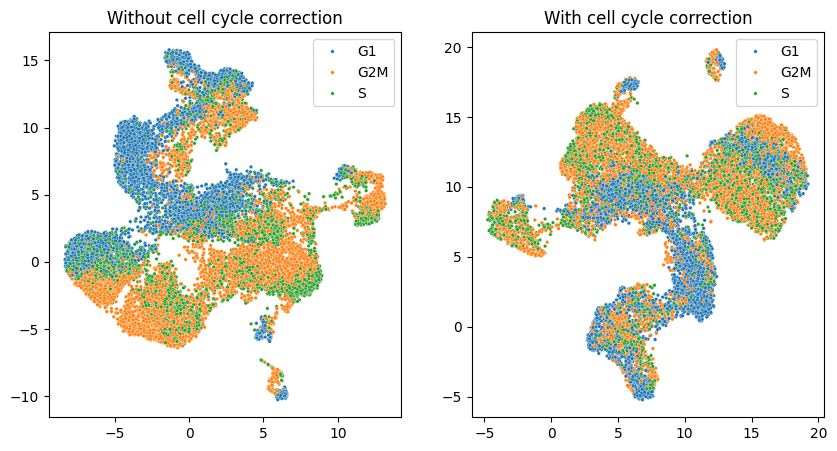

In [48]:
fig,ax = plt.subplots(1,2,figsize=[10,5])
sns.scatterplot(
    x=adata.obsm["X_umap_pca"][:,0],
    y=adata.obsm["X_umap_pca"][:,1],
    hue=adata.obs["phase"].values,
    s=marker_size, ax=ax[0])
ax[0].set_title("Without cell cycle correction")
sns.scatterplot(
    x=adata.obsm["X_umap_pca_phase"][:,0],
    y=adata.obsm["X_umap_pca_phase"][:,1],
    hue=adata.obs["phase"].values,
    s=marker_size, ax=ax[1])
ax[1].set_title("With cell cycle correction")
fig.savefig(f"{output_folder}/{analysis_name}/dr_umap_pca.{save_format}")

## scVI

In [49]:
adata_ = adata[:,adata.var["highly_variable"].values]
adata_ = adata_.copy()

In [50]:
scvi.model.SCVI.setup_anndata(adata_,layer="counts",continuous_covariate_keys=["S_score","G2M_score"])
vae = scvi.model.SCVI(adata_)
batch_size = 128
not_worked = True
while not_worked:
    try:
        vae.train(
            max_epochs=200,
            early_stopping=True,
            check_val_every_n_epoch=1,
            early_stopping_monitor='elbo_validation',
            batch_size=batch_size
        )
        not_worked = False
    except:
        batch_size *= 2

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 200/200: 100%|██████████| 200/200 [02:20<00:00,  1.44it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.36e+3]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [02:20<00:00,  1.43it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=1.36e+3]


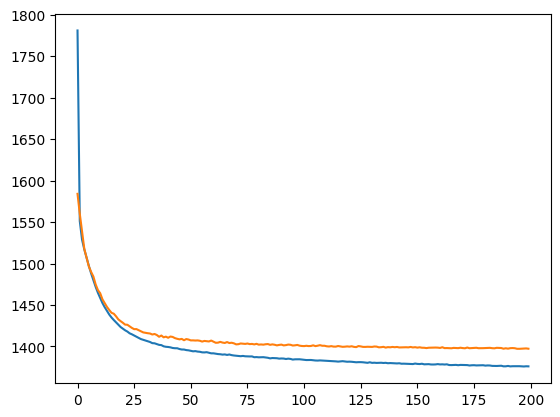

In [51]:
plt.plot(vae.history["elbo_train"].values)
plt.plot(vae.history["elbo_validation"].values)

In [52]:
adata.obsm["X_scvi"] = vae.get_latent_representation()

In [53]:
sp.pp.neighbors(adata, 
                metric=parameters["metric"], 
                use_rep="X_scvi",
                key_added="neighbors_scvi",
                n_neighbors=10,
)
sp.tl.umap(adata, neighbors_key="neighbors_scvi")
adata.obsm["X_umap_scvi"] = adata.obsm["X_umap"].copy()

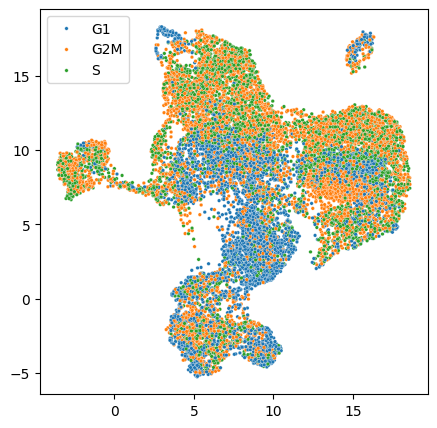

In [54]:
fig,ax = plt.subplots(figsize=[5,5])
sns.scatterplot(
    x=adata.obsm["X_umap_scvi"][:,0],
    y=adata.obsm["X_umap_scvi"][:,1],
    hue=adata.obs["phase"].values,
    s=marker_size)
fig.savefig(f"{output_folder}/{analysis_name}/dr_umap_scvi.{save_format}")    

## PCA and scVI QC plots

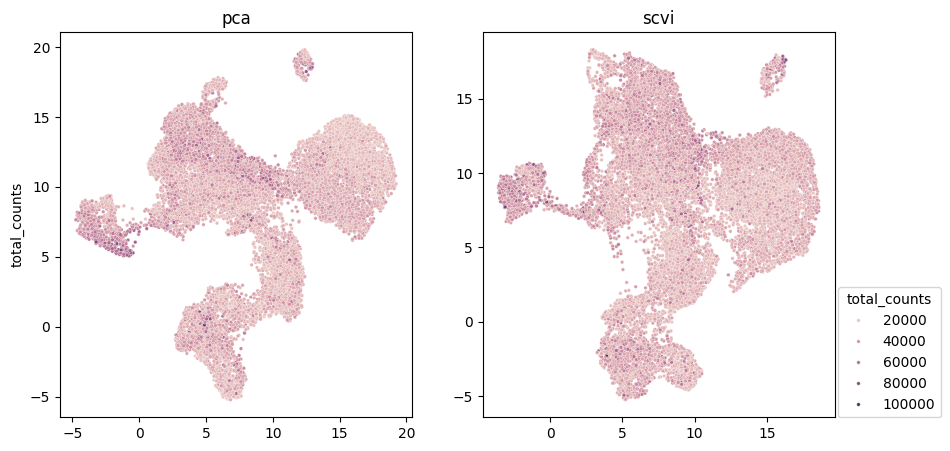

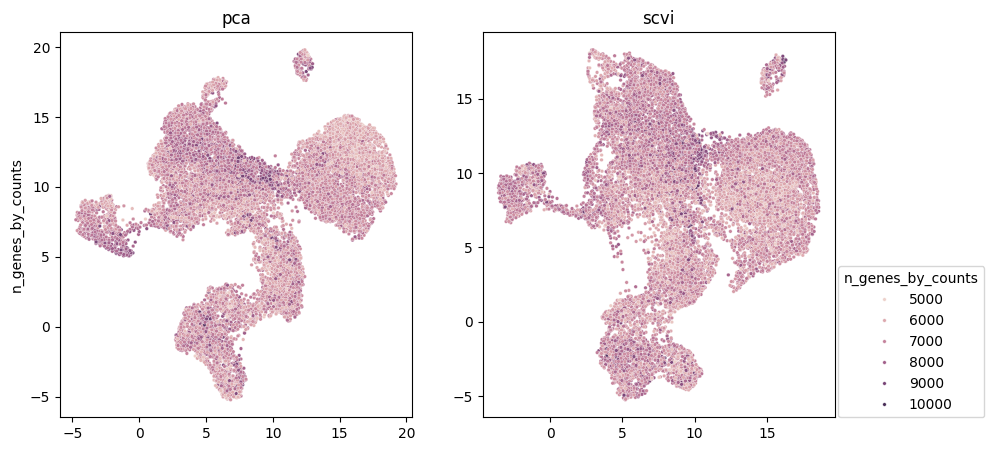

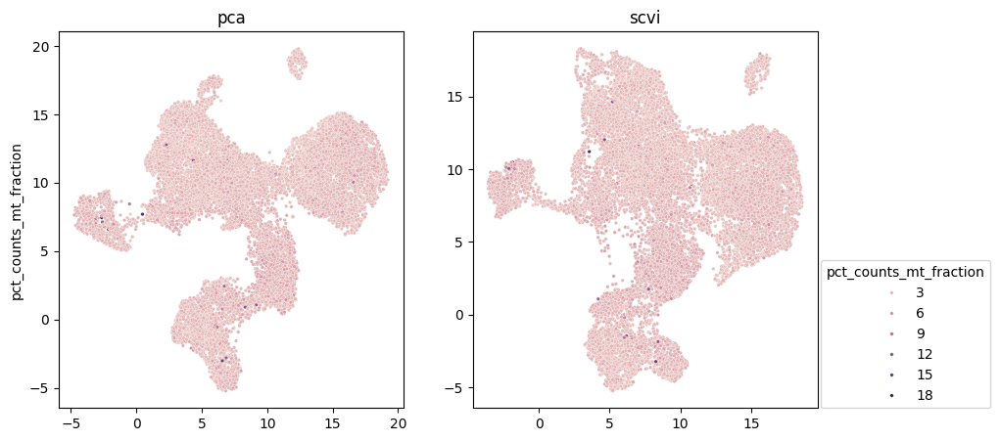

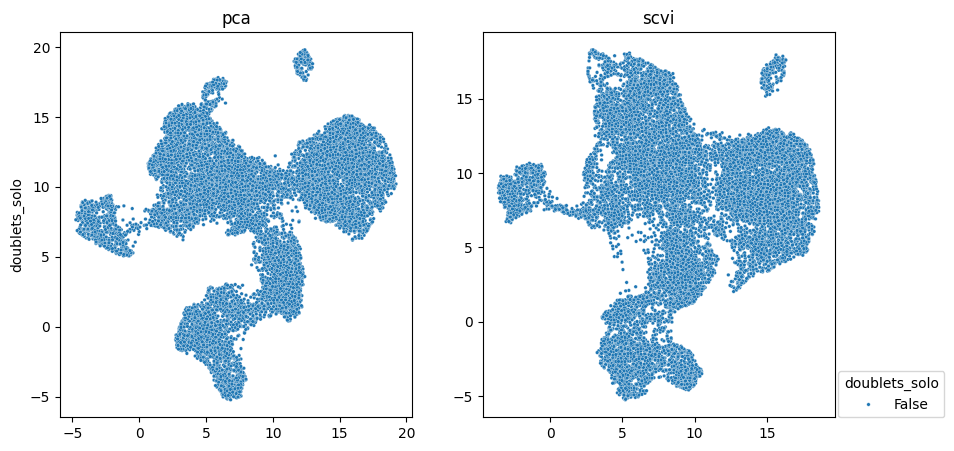

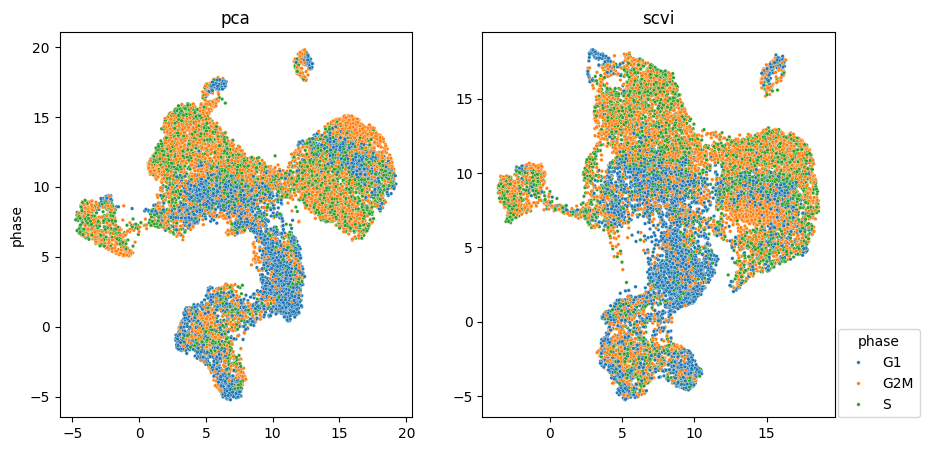

In [55]:
plots = [
    "total_counts",
    "n_genes_by_counts",
    "pct_counts_mt_fraction",
    "doublets_solo",
    "phase"
]

for plot in plots:
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    
    hue = adata.obs[plot].values

    sns.scatterplot(x=adata.obsm["X_umap_pca_phase"][:,0],y=adata.obsm["X_umap_pca_phase"][:,1],hue=hue,ax=ax[0],s=marker_size)
    ax[0].get_legend().remove()
    ax[0].set_title(f"pca")
    sns.scatterplot(x=adata.obsm["X_umap_scvi"][:,0],y=adata.obsm["X_umap_scvi"][:,1],hue=hue,ax=ax[1],s=marker_size)
    ax[1].legend(loc=(1.01,0),title=f"{plot}")
    ax[1].set_title(f"scvi")
    ax[0].set_ylabel(plot)
            
    fig.savefig(f"{output_folder}/{analysis_name}/dr_umap_final_{plot}.{save_format}")    

## Save

In [56]:
adata.write(file_modified)

# Clustering

In [57]:
adata = sp.read(file_modified)

In [58]:
sp.tl.leiden(adata, neighbors_key="neighbors_pca_phase", resolution=1)
adata.obs.leiden.unique()

['16', '1', '11', '5', '6', ..., '2', '8', '9', '12', '7']
Length: 17
Categories (17, object): ['0', '1', '2', '3', ..., '13', '14', '15', '16']

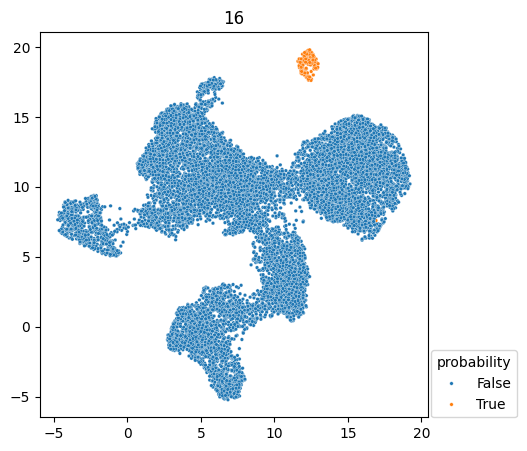

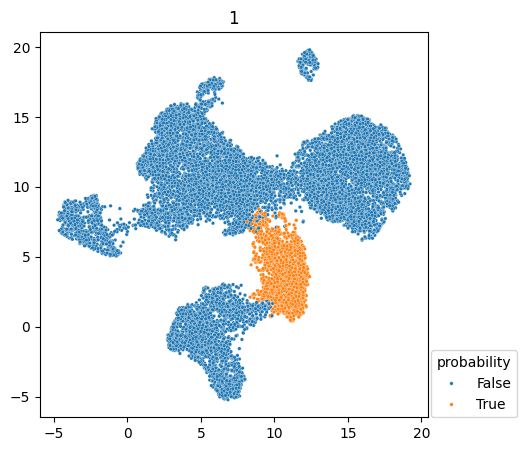

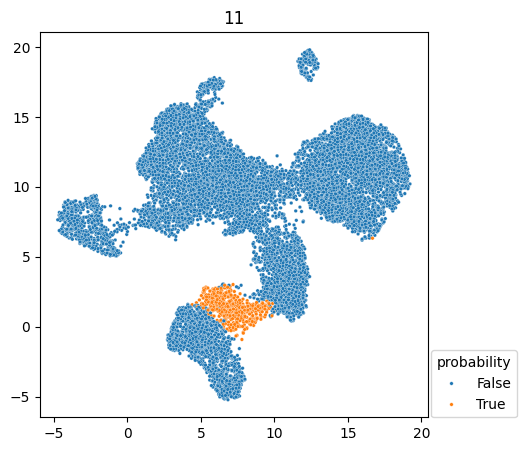

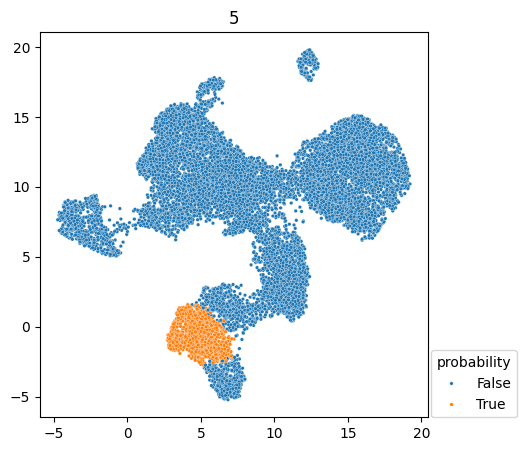

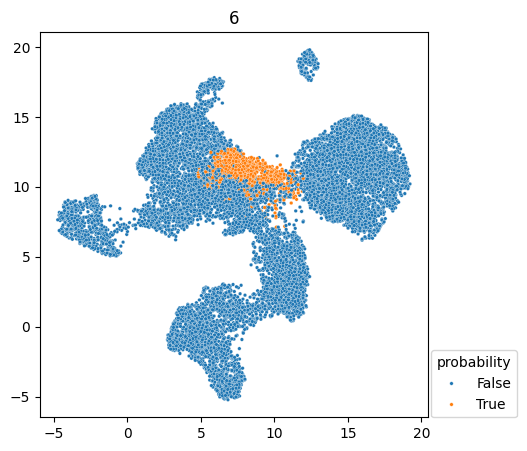

...

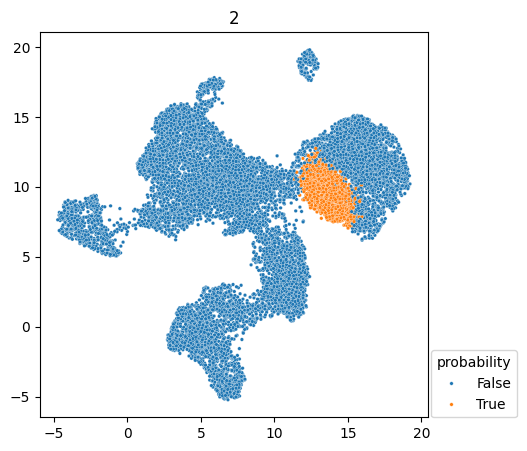

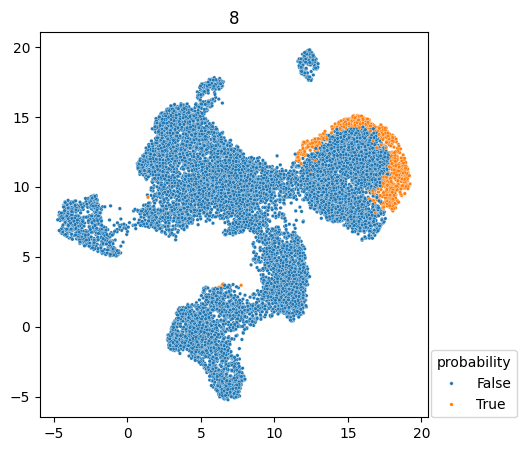

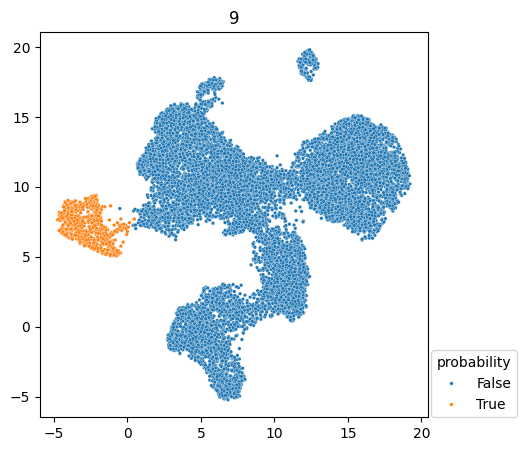

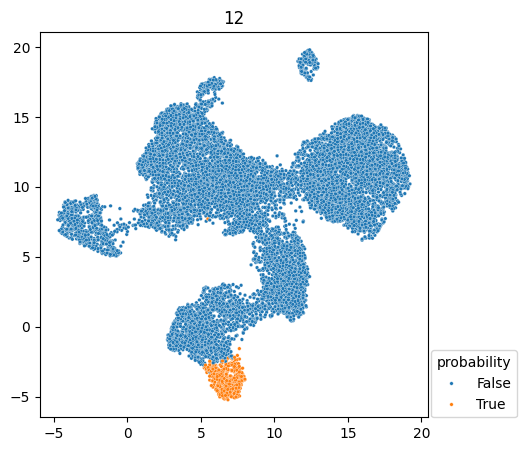

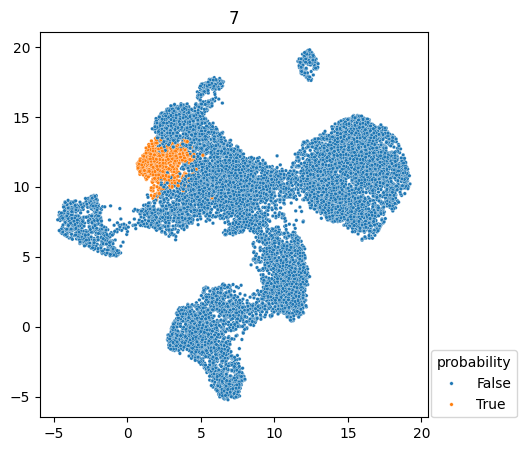

In [59]:
for i in adata.obs["leiden"].unique():

    p_ = adata.obs["leiden"].values == i
    
    fig,ax = plt.subplots(1,1,figsize=[5,5])
    sns.scatterplot(
        x=adata.obsm["X_umap_pca_phase"][:,0],
        y=adata.obsm["X_umap_pca_phase"][:,1],
        hue=p_,
        s=marker_size,
        ax=ax)
    ax.get_legend().remove()
    ax.set_title(i)
    ax.legend(loc=(1.01,0),title="probability")

    fig.savefig(f"{output_folder}/{analysis_name}/clusters_v2/cluster_pca_{i}.{save_format}")


In [60]:
adata.write(file_modified)

## Load

In [61]:
adata = sp.read(file_modified)

In [62]:
if "n_pcs" not in parameters:
    parameters = pd.read_csv(parameters_filled,index_col=0).loc[analysis_name,:].dropna().to_dict()
parameters

{'total_counts_min': 14000.0,
 'total_counts_max': 140000.0,
 'n_genes_by_counts_min': 5000.0,
 'n_genes_by_counts_max': 12000.0,
 'pct_counts_mt_fraction_min': 1.0,
 'pct_counts_mt_fraction_max': 20.0,
 'metric': 'correlation',
 'n_top_genes': 2000,
 'n_pcs': 30.0,
 'pca_random_factor': 3,
 'remove_doublets': True,
 'clustering_threshold': 0.5,
 'clusters': '[20,21,27,28,9,22,23,24,13,25,26,15,18,19,17,11,5,6,7]',
 'target_sum': 26871.3745584125}

In [63]:
model = tc.RobustClusteringLeiden(
    connectivity_matrix=adata.obsp["neighbors_pca_phase_connectivities"],
    X=adata.obsm["X_pca_phase"][:,:int(parameters["n_pcs"])],
    parameter_range=(0,3),
    n_clusters_max=50,
    stop_threshold=parameters["clustering_threshold"]
)

16it [00:12,  1.30it/s]
197it [04:11,  1.28s/it, resolution_parameter=0.00118] 


In [64]:
model.fit()

100%|██████████| 14/14 [01:57<00:00,  8.43s/it]


In [65]:
adata.obsm["hierarchical_clustering"] = model._metrics["connectivity_probability"]

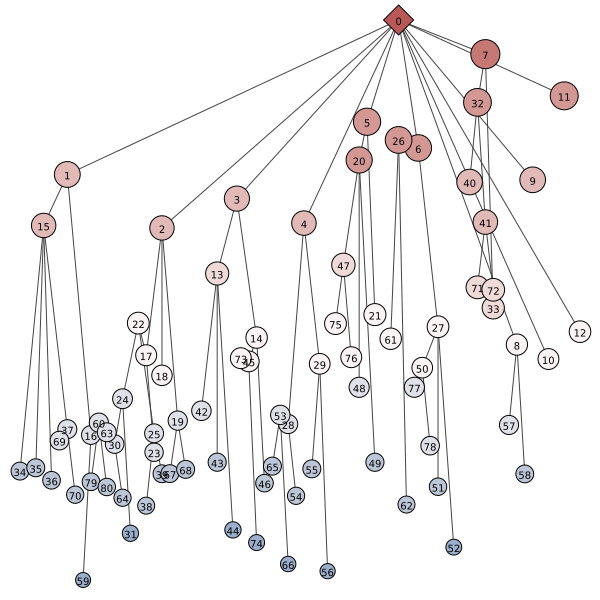

In [66]:
#model.set_threshold(metric="connectivity_probability", threshold=0.1)
model.plot_graph(
    y = "connectivity_probability",
    color = "connectivity_probability",
    size = "connectivity_probability",
    size_norm=(30,15),
    invert=True,
    palette="vlag",
    target=f"{output_folder}/{analysis_name}/cluster_graph_pca.{save_format}"
)

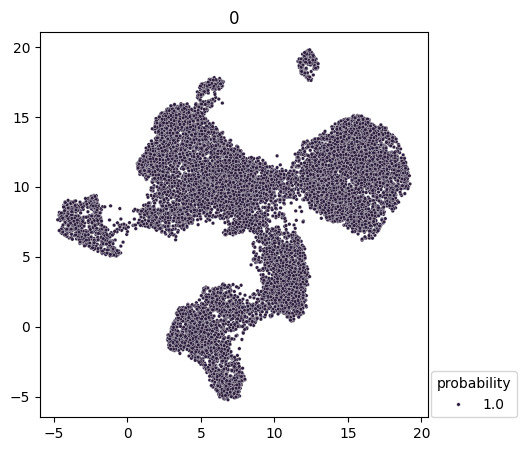

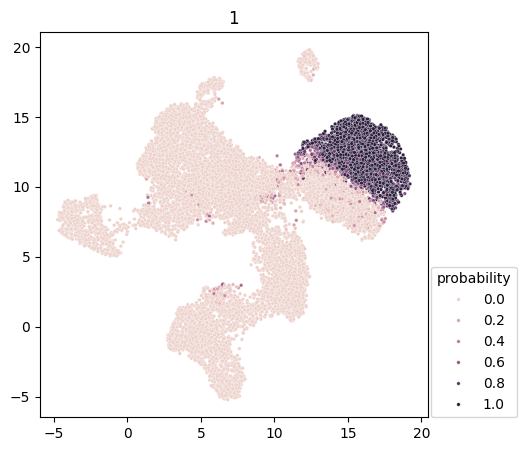

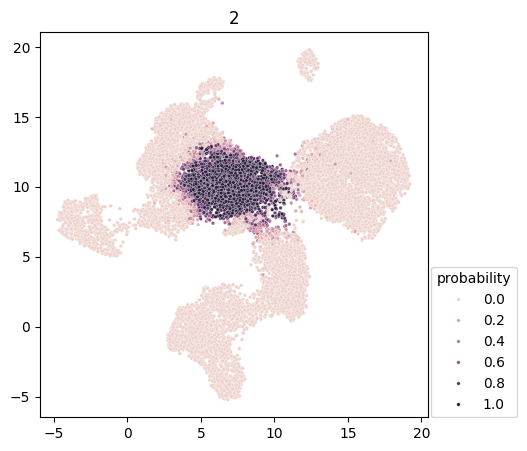

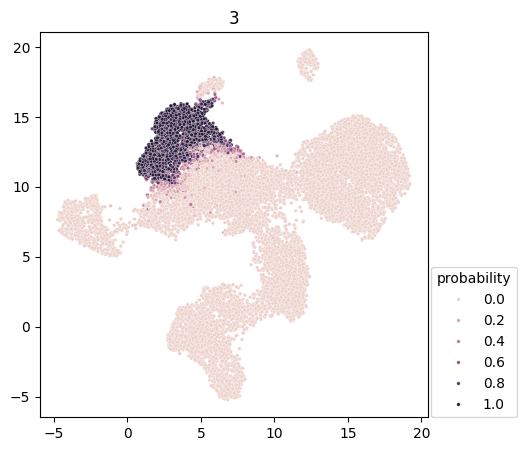

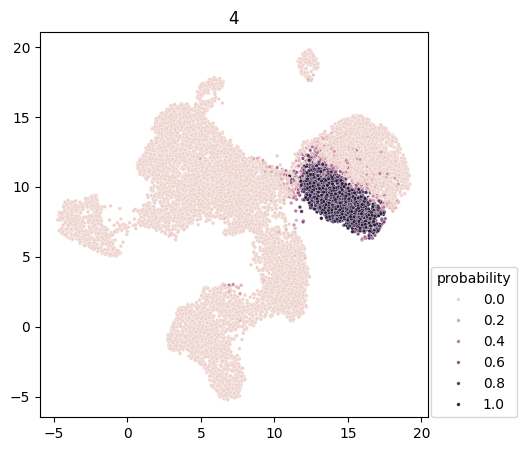

...

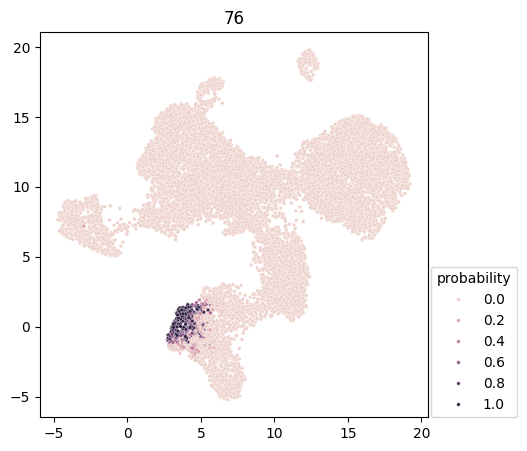

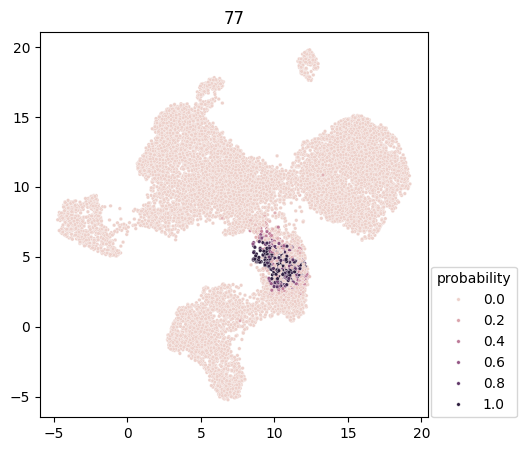

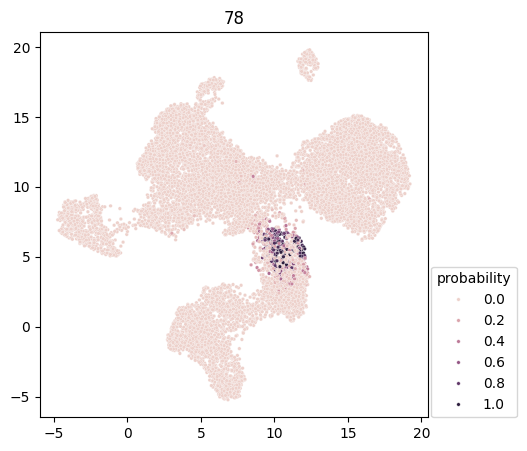

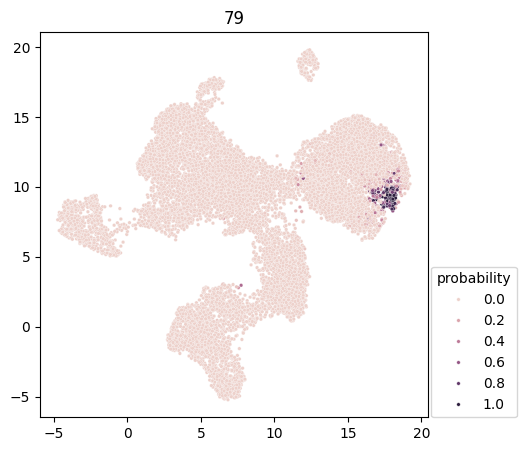

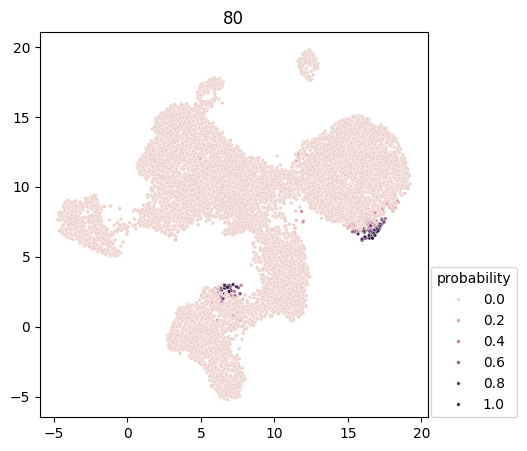

In [67]:
counts = adata.layers["counts"]
writer = pd.ExcelWriter(f"{output_folder}/{analysis_name}/cluster_DE.xlsx", engine='xlsxwriter')
for i in range(adata.obsm["hierarchical_clustering"].shape[1]):

    p_ = adata.obsm["hierarchical_clustering"][:,i] > 0.5

    c = counts[p_,:]
    c_ = counts[~p_,:]
    if c_.shape[0] > 0:
        try:
            ttest_result = ttest_sparse_matrices(c,c_,True)
            df = pd.DataFrame()
            df["genes"] = adata.var_names
            df["ttest_statistic"] = ttest_result[0]
            df["ttest_pvalue"] = ttest_result[1]
            df["logfold"] = np.array(c.log1p().mean(axis=0)/c_.log1p().mean(axis=0)).flatten()
    
            df = df.sort_values("ttest_statistic")
            
            df.to_excel(writer, sheet_name=f"{i}", index=False)
        except:
            None
    
    fig,ax = plt.subplots(1,1,figsize=[5,5])
    sns.scatterplot(
        x=adata.obsm["X_umap_pca_phase"][:,0],
        y=adata.obsm["X_umap_pca_phase"][:,1],
        hue=adata.obsm["hierarchical_clustering"][:,i],
        hue_norm=(0,1),
        s=marker_size,
        ax=ax)
    ax.get_legend().remove()
    ax.set_title(i)
    ax.legend(loc=(1.01,0),title="probability")

    fig.savefig(f"{output_folder}/{analysis_name}/clusters/cluster_pca_{i}.{save_format}")

writer.close()

## Save

In [68]:
adata.write(file_modified)

# Annotation

## Meta annotation

In [69]:
if "celltype_extended_atlas" in adata.obs.columns.values:
    adata.obs["meta_annotation"] = adata.obs["celltype_extended_atlas"]
    adata.obs["barcode"] = 1
    adata.obs["meta_umap1"] = adata.obsm["X_umap_pca"][:,0]
    adata.obs["meta_umap2"] = adata.obsm["X_umap_pca"][:,1]

if "meta_annotation" in adata.obs.columns.values:

    palette = sns.color_palette("Paired")+sns.color_palette("colorblind")

    fig,ax = plt.subplot_mosaic([[0,1,2],[3,3,3]],figsize=[18,10])
    sns.scatterplot(x=adata.obsm["X_umap_pca_phase"][:,0],y=adata.obsm["X_umap_pca_phase"][:,1],hue=adata.obs["meta_annotation"].values,ax=ax[0],palette=palette)
    ax[0].get_legend().remove()
    ax[0].set_title(f"pca")
    sns.scatterplot(x=adata.obsm["X_umap_scvi"][:,0],y=adata.obsm["X_umap_scvi"][:,1],hue=adata.obs["meta_annotation"].values,ax=ax[1],palette=palette)
    ax[1].get_legend().remove()
    ax[1].set_title(f"scvi")
    sns.scatterplot(x=adata.obs["meta_umap1"].values,y=adata.obs["meta_umap2"].values,hue=adata.obs["meta_annotation"].values,ax=ax[2],palette=palette)
    ax[2].legend(loc=(1.01,-1),title="annotation")
    ax[2].set_title(f"meta_umap")

    adata.obs.groupby("meta_annotation").count()["barcode"].plot.bar(color=palette, ax = ax[3])
    
    fig.savefig(f"{output_folder}/{analysis_name}/dr_meta_annotation.{save_format}")     

## Marker genes

In [70]:
with open("./markers.json","r") as file:
    markers = json.load(file)

### UMAP plots

In [71]:
genes = pd.read_csv("markers.csv",header=None).values[:,0]

for gene in genes:
    if "meta_annotation" in adata.obs.columns.values:
        n = 4
    else:
        n = 3
        
    if gene in adata.var.index.values:
        fig,ax = plt.subplots(1,n,figsize=(5.5*n,5.5))
        hue = adata[:,gene].X.toarray()[:,0]

        sns.scatterplot(x=adata.obsm["X_umap_pca"][:,0],y=adata.obsm["X_umap_pca"][:,1],hue=hue,ax=ax[0],s=marker_size)
        ax[0].get_legend().remove()
        ax[0].set_title(f"pca wto gene cycle correction")
        sns.scatterplot(x=adata.obsm["X_umap_pca_phase"][:,0],y=adata.obsm["X_umap_pca_phase"][:,1],hue=hue,ax=ax[1],s=marker_size)
        ax[1].get_legend().remove()
        ax[1].set_title(f"pca")
        sns.scatterplot(x=adata.obsm["X_umap_scvi"][:,0],y=adata.obsm["X_umap_scvi"][:,1],hue=hue,ax=ax[2],s=marker_size)
        ax[2].legend(loc=(1.01,0),title=f"{gene}")
        ax[2].set_title(f"scvi")
        # ax[0].set_ylabel(marker)

        if n == 4:
            ax[1].get_legend().remove()
            sns.scatterplot(x=adata.obs["meta_umap1"].values,y=adata.obs["meta_umap2"].values,hue=hue,ax=ax[2])
            ax[2].legend(loc=(1.01,0),title=f"{gene}")
            
        fig.savefig(f"{output_folder}/{analysis_name}/umap_genes/{gene}.{save_format}")    
        plt.close(fig)
    else:
        print(f"Gene {gene} not in genes.")

# Write parameters

In [72]:
if os.path.isfile(parameters_filled):
    parameters_ = pd.read_csv(parameters_filled,index_col=0)
else:
    parameters_ = pd.read_csv(parameters_file,index_col=0)
parameters_.loc[analysis_name,:] = pd.Series(parameters)

In [73]:
parameters_.to_csv(parameters_filled)